<a href="https://colab.research.google.com/github/YongjunByun/KSA_projects/blob/main/module10/GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torchvision import datasets as dset
from torch.utils.data import DataLoader
import matplotlib as plt
import matplotlib.pyplot as plt
torch.manual_seed(0)

def gen_block(input_dia, output_dia):
    return nn.Sequential(
        nn.Linear(input_dia, output_dia),
        nn.BatchNorm1d(output_dia),
        nn.ReLU(inplace=True)
    )

def disc_block(input_dia, output_dia):
    return nn.Sequential(
        nn.Linear(input_dia, output_dia),
        nn.LeakyReLU(0.2, inplace=True)
    )


class Generator(nn.Module):
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        self.gen = nn.Sequential(
            gen_block(z_dim, hidden_dim),
            gen_block(hidden_dim, hidden_dim * 2),
            gen_block(hidden_dim * 2, hidden_dim * 4),
            gen_block(hidden_dim * 4, hidden_dim * 8),

            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
        )
    def forward(self, noise):
        return self.gen(noise)
    def get_gen(self):
        return self.gen



class Discriminator(nn.Module):
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            disc_block(im_dim, hidden_dim * 4),
            disc_block(hidden_dim * 4, hidden_dim * 2),
            disc_block(hidden_dim * 2, hidden_dim),
            nn.Linear(hidden_dim, 1)
        )

    def forward(self, image):
        return self.disc(image)

    def get_disc(self):
        return self.disc

def get_noise(n_samples, z_dim, device='gpu'):
    return torch.randn(n_samples, z_dim, device=device)

criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001
device = 'cuda'

dataloader = DataLoader(
    MNIST(',', download=True, transform=transforms.ToTensor()),
    batch_size = batch_size,
    shuffle = True
)

gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake.detach())
    disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
    disc_real_pred = disc(real)

    disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
    disc_loss = (disc_fake_loss + disc_real_loss) / 2
    return disc_loss


def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake)
    gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))

    return gen_loss

def show_tensor_images(image_tensor, num_images=25, size=(1,28,28)):
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True
gen_loss = False
error = False


step 500: Generator loss : 1.3937792605161663, discriminator loss: 0.42074688607454297


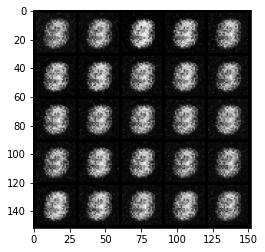

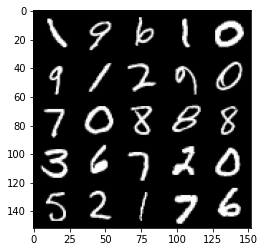

step 1000: Generator loss : 1.6741628971099851, discriminator loss: 0.2989503865838051


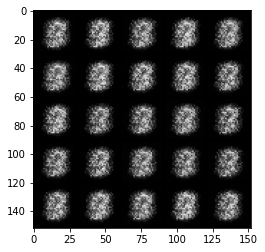

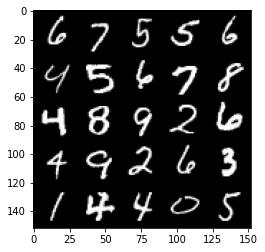

step 1500: Generator loss : 1.9602784776687627, discriminator loss: 0.17423550984263417


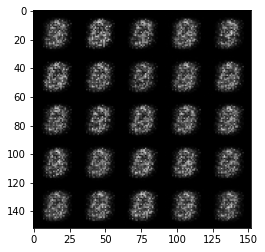

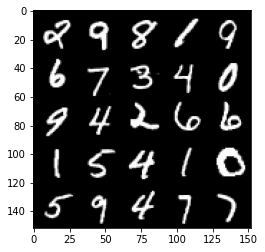

step 2000: Generator loss : 1.759232807159423, discriminator loss: 0.1977966770529749


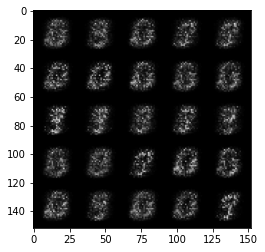

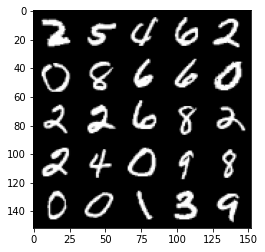

step 2500: Generator loss : 1.7496352086067208, discriminator loss: 0.191427605241537


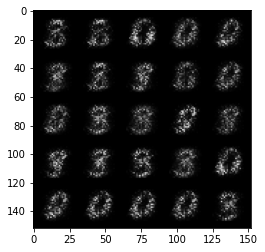

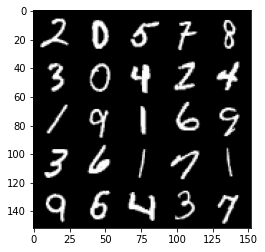

step 3000: Generator loss : 2.0216054871082303, discriminator loss: 0.15003359197080135


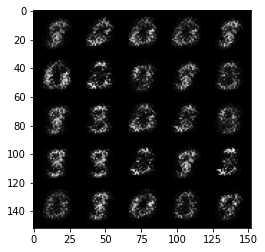

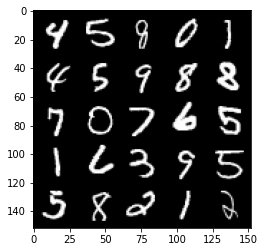

step 3500: Generator loss : 2.391618532180786, discriminator loss: 0.12850664201378822


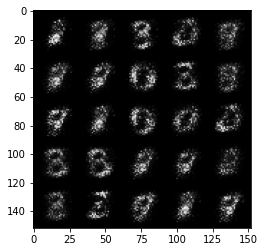

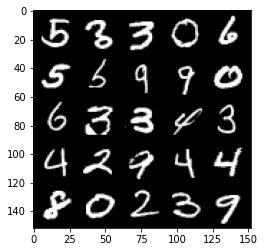

step 4000: Generator loss : 2.7345185422897336, discriminator loss: 0.12371852970123284


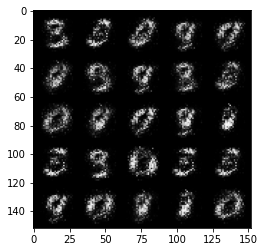

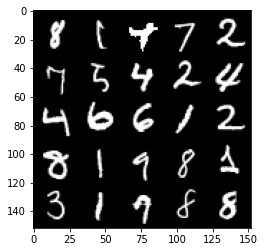

step 4500: Generator loss : 3.070453720092774, discriminator loss: 0.10472024151682856


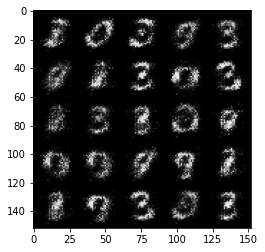

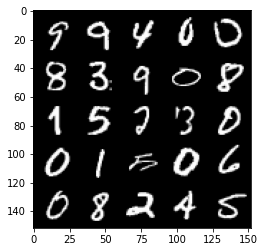

step 5000: Generator loss : 3.321559638023376, discriminator loss: 0.08995626547932618


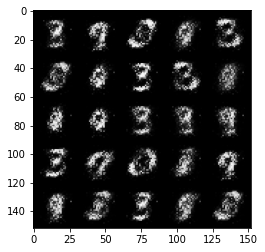

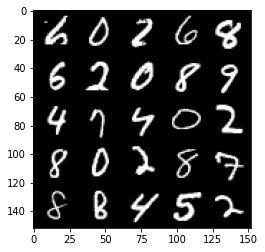

step 5500: Generator loss : 3.6196771097183214, discriminator loss: 0.08340209031105045


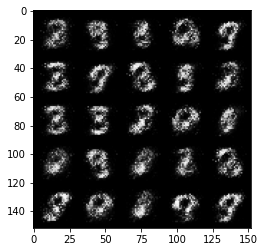

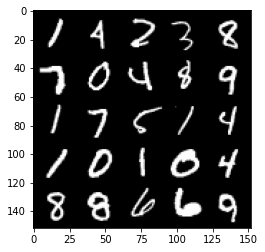

step 6000: Generator loss : 3.469196911334991, discriminator loss: 0.08073364374041558


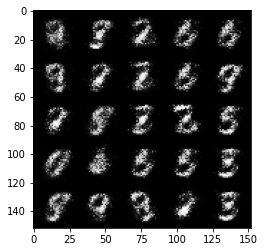

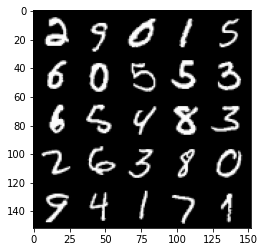

step 6500: Generator loss : 3.858661239147184, discriminator loss: 0.0614725291840732


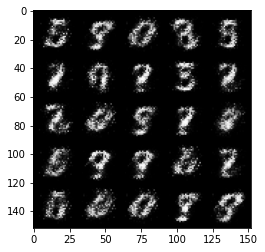

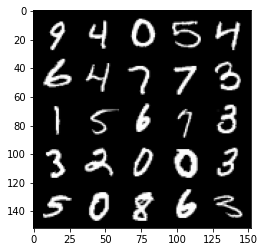

step 7000: Generator loss : 3.998444404602051, discriminator loss: 0.058953365206718435


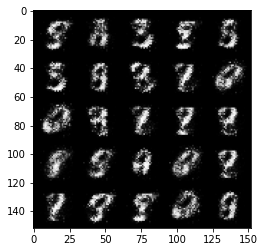

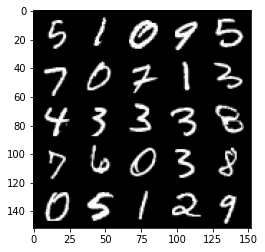

step 7500: Generator loss : 4.0392177915573075, discriminator loss: 0.05017214727401727


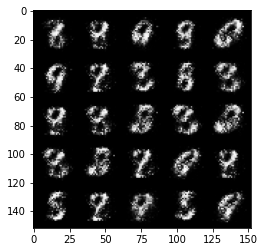

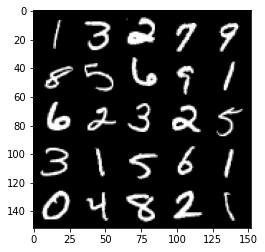

step 8000: Generator loss : 4.151947334766387, discriminator loss: 0.05171389809250832


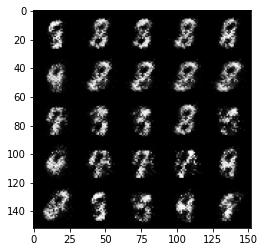

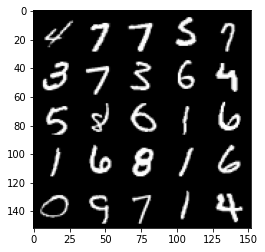

step 8500: Generator loss : 3.97478838968277, discriminator loss: 0.06971901487559069


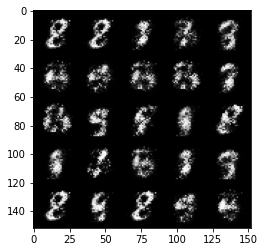

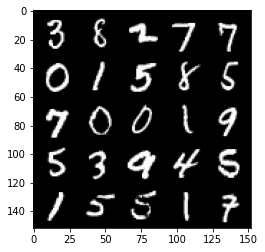

step 9000: Generator loss : 4.2312111582756025, discriminator loss: 0.05795324417203664


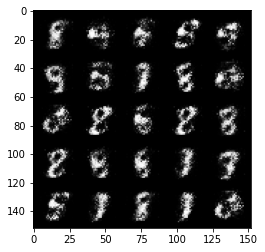

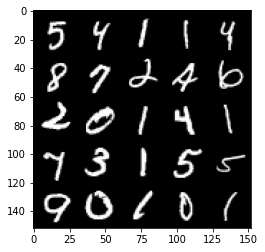

step 9500: Generator loss : 4.154950047492977, discriminator loss: 0.0658489714711905


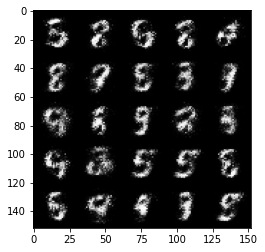

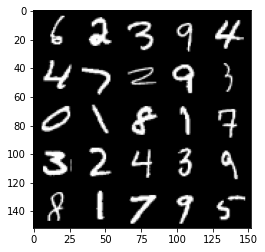

step 10000: Generator loss : 4.023970030307768, discriminator loss: 0.06412200535088779


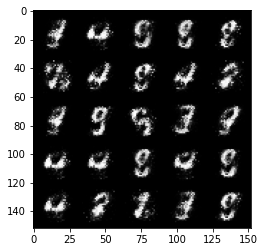

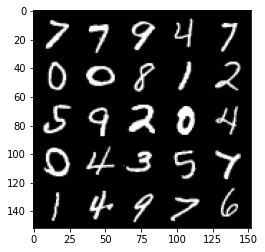

step 10500: Generator loss : 3.9746951432228124, discriminator loss: 0.059098433773964607


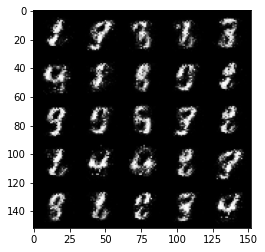

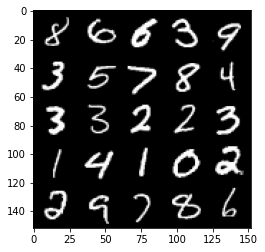

step 11000: Generator loss : 4.051092830657958, discriminator loss: 0.06871737600117919


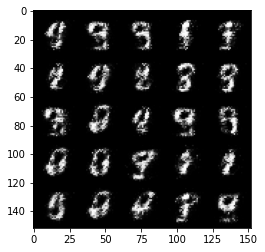

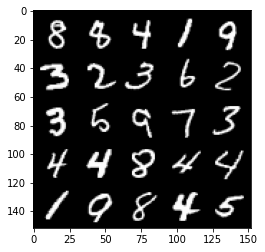

step 11500: Generator loss : 4.13729800081253, discriminator loss: 0.07469988391548399


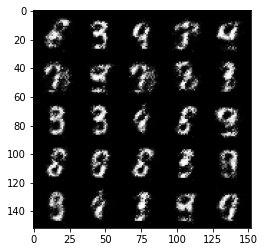

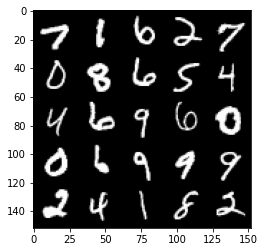

step 12000: Generator loss : 4.045717242717742, discriminator loss: 0.06940225274115792


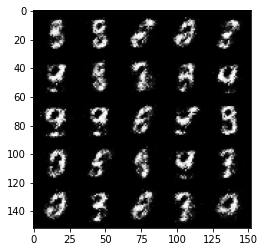

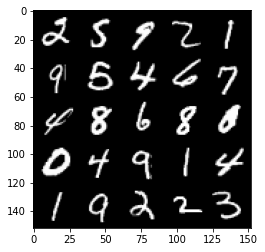

step 12500: Generator loss : 3.9595640988349894, discriminator loss: 0.0782515227757395


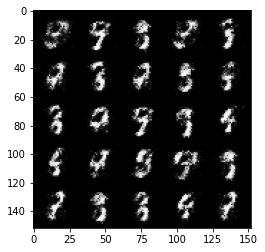

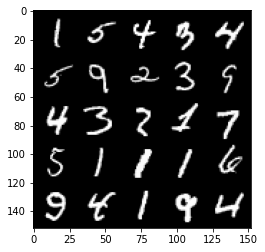

step 13000: Generator loss : 3.808825451850893, discriminator loss: 0.09078724700212475


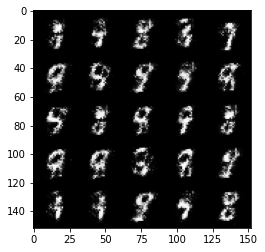

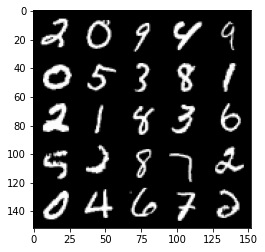

step 13500: Generator loss : 3.722096206665037, discriminator loss: 0.096429569914937


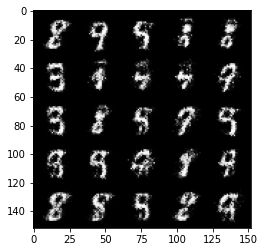

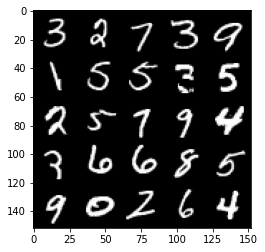

step 14000: Generator loss : 4.060889761447903, discriminator loss: 0.08113053433597096


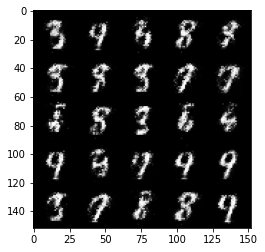

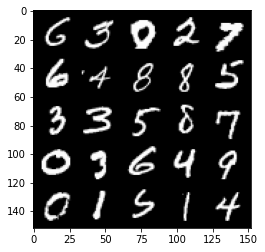

step 14500: Generator loss : 3.8200705394744903, discriminator loss: 0.10233818667382016


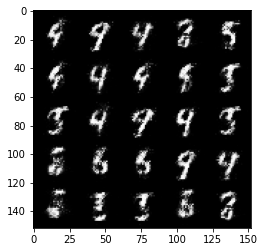

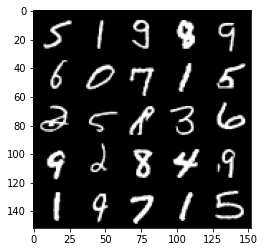

step 15000: Generator loss : 3.6825629487037657, discriminator loss: 0.09684589577466254


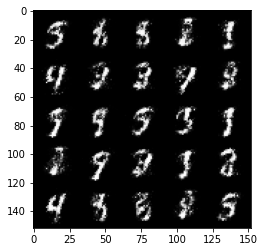

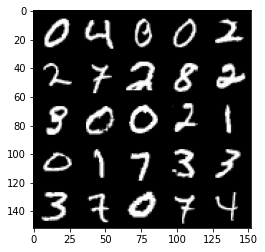

step 15500: Generator loss : 3.763503244400025, discriminator loss: 0.1023350162431598


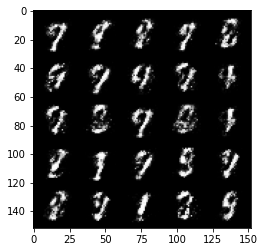

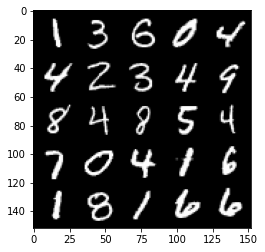

step 16000: Generator loss : 3.652334143161774, discriminator loss: 0.110407947026193


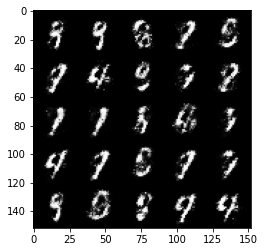

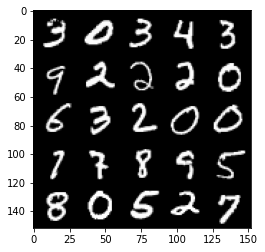

step 16500: Generator loss : 3.6648519601821894, discriminator loss: 0.12346602810174231


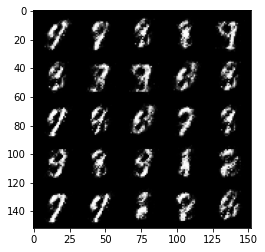

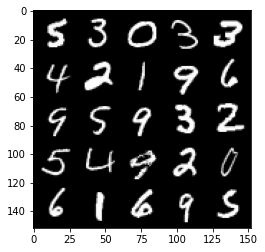

step 17000: Generator loss : 3.5558257398605373, discriminator loss: 0.11187195935100312


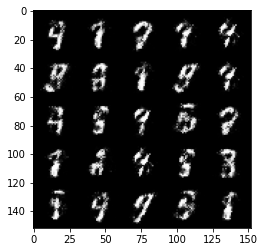

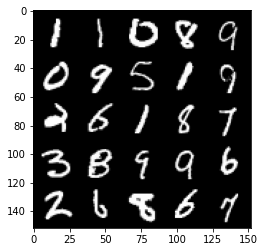

step 17500: Generator loss : 3.5996116428375227, discriminator loss: 0.12029650012403727


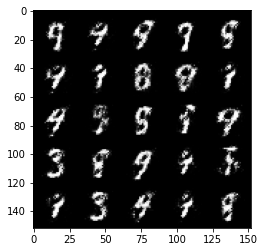

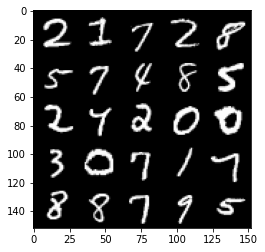

step 18000: Generator loss : 3.578579617023468, discriminator loss: 0.11738486962765458


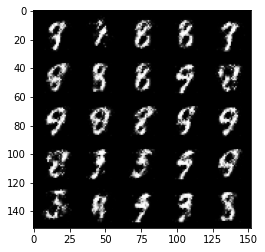

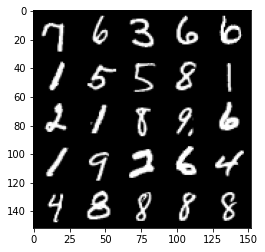

step 18500: Generator loss : 3.540293685436247, discriminator loss: 0.12763210330903524


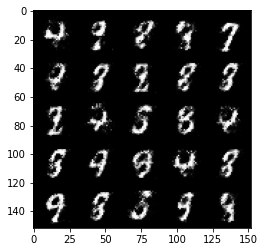

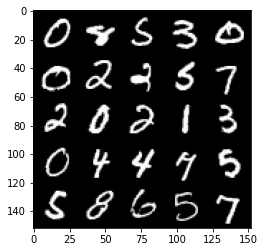

step 19000: Generator loss : 3.3685810775756853, discriminator loss: 0.12060725557804104


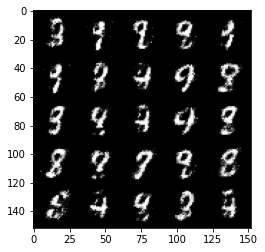

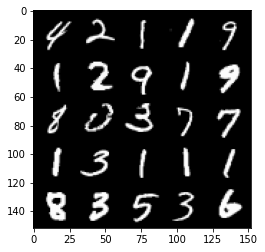

step 19500: Generator loss : 3.2491470723152185, discriminator loss: 0.14492695543169964


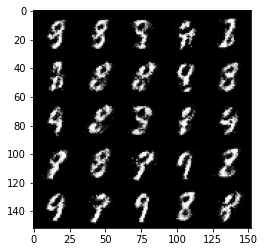

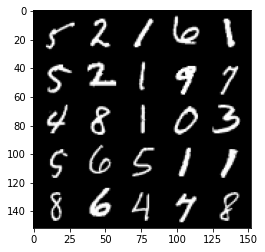

step 20000: Generator loss : 3.215712878704072, discriminator loss: 0.14886663784086684


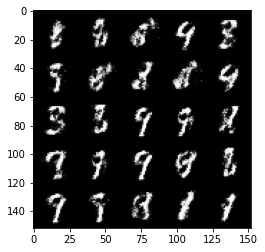

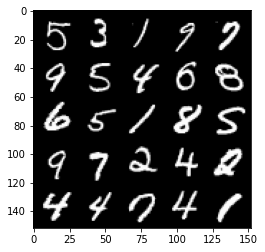

step 20500: Generator loss : 3.220839270591734, discriminator loss: 0.14990651749074463


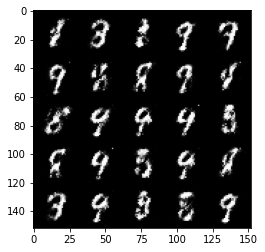

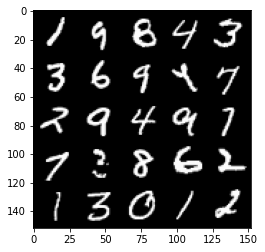

step 21000: Generator loss : 3.1493307557106025, discriminator loss: 0.15740451171994224


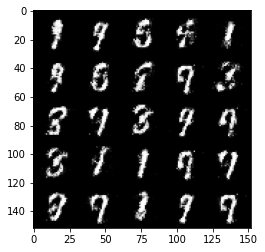

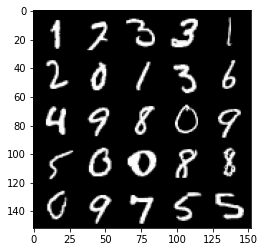

step 21500: Generator loss : 3.143903621196751, discriminator loss: 0.15929353715479375


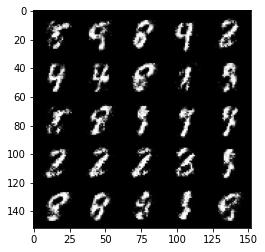

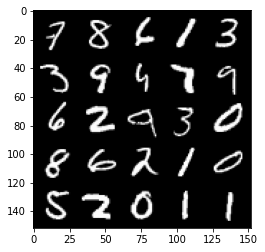

step 22000: Generator loss : 3.171038761138915, discriminator loss: 0.1553752289265394


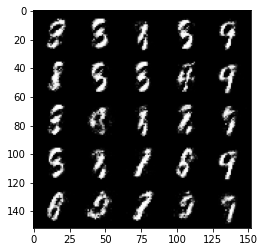

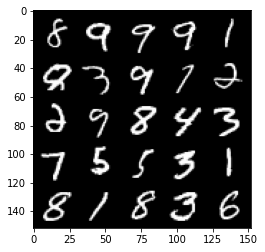

step 22500: Generator loss : 3.084286031723021, discriminator loss: 0.16257982985675326


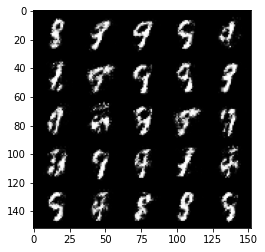

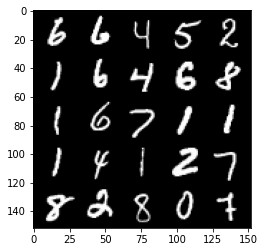

step 23000: Generator loss : 3.0826551046371473, discriminator loss: 0.17423435916006574


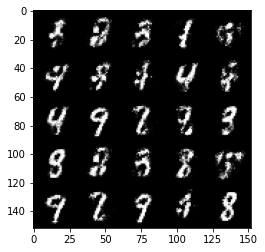

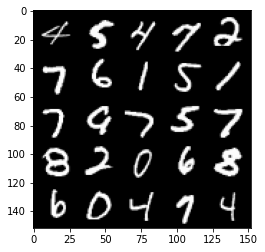

step 23500: Generator loss : 2.9258007040023792, discriminator loss: 0.18018094685673725


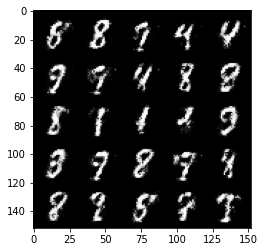

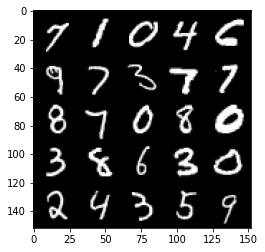

step 24000: Generator loss : 3.0315930752754245, discriminator loss: 0.16583498619496823


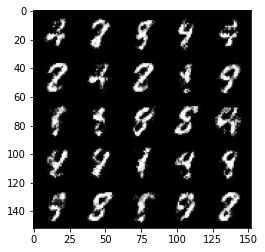

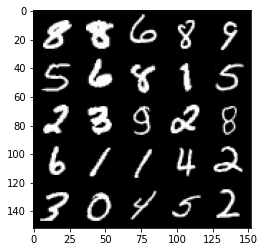

step 24500: Generator loss : 3.1678817205429053, discriminator loss: 0.16324621601402758


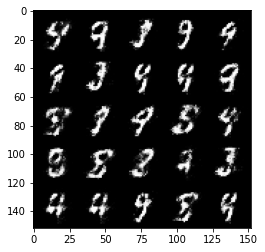

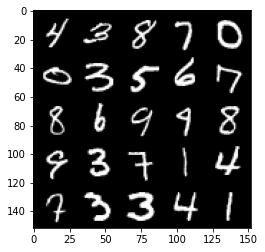

step 25000: Generator loss : 2.9964723620414717, discriminator loss: 0.1771181217283009


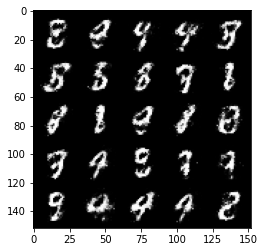

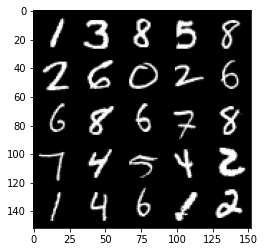

step 25500: Generator loss : 2.8884990634918193, discriminator loss: 0.2063342990577222


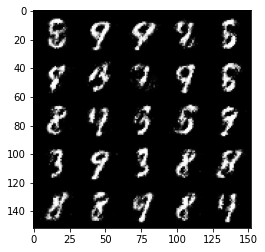

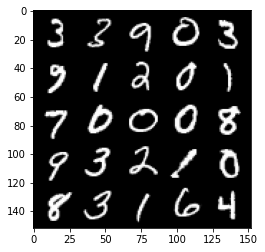

step 26000: Generator loss : 2.8607294054031382, discriminator loss: 0.2000912421643734


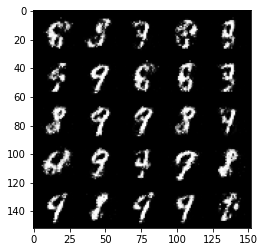

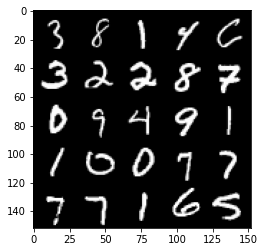

step 26500: Generator loss : 2.690569672584533, discriminator loss: 0.22462992475926882


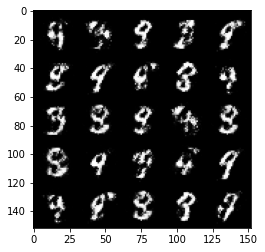

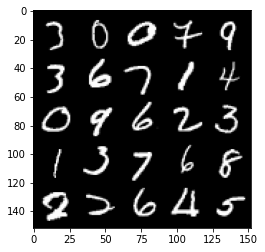

step 27000: Generator loss : 2.833137895584105, discriminator loss: 0.19815886324644086


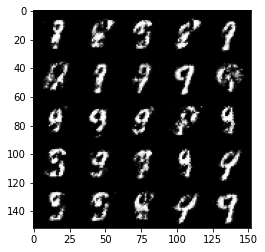

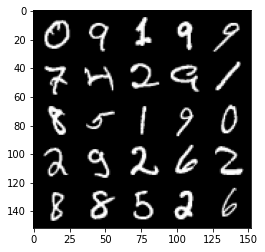

step 27500: Generator loss : 2.747727805614468, discriminator loss: 0.21739709480106836


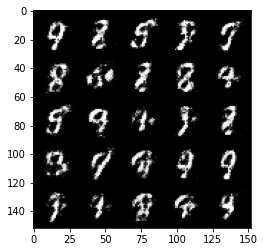

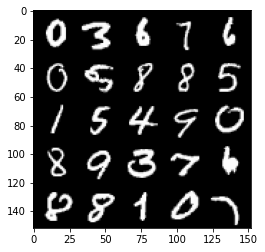

step 28000: Generator loss : 2.7336609396934515, discriminator loss: 0.21289557127654535


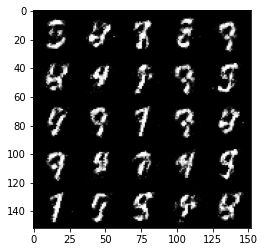

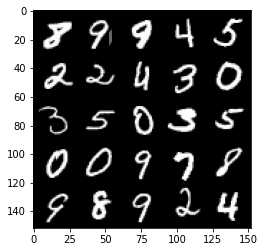

step 28500: Generator loss : 2.675502223968506, discriminator loss: 0.2063890773653985


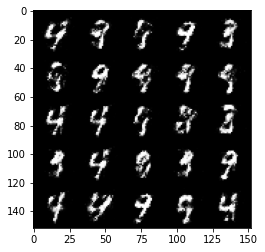

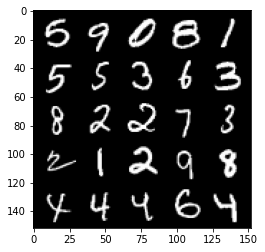

step 29000: Generator loss : 2.635149460315707, discriminator loss: 0.21516008180379845


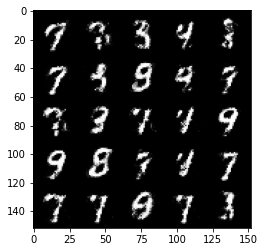

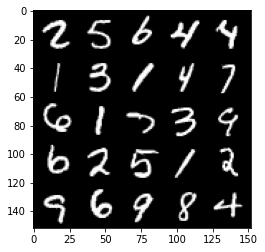

step 29500: Generator loss : 2.4893562760353087, discriminator loss: 0.23650828030705445


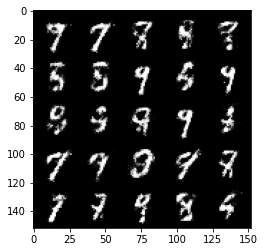

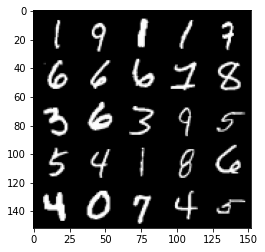

step 30000: Generator loss : 2.3654165382385246, discriminator loss: 0.27375964736938474


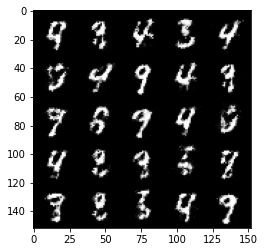

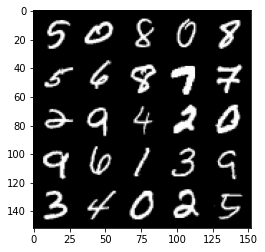

step 30500: Generator loss : 2.5234819829463966, discriminator loss: 0.2281292317956686


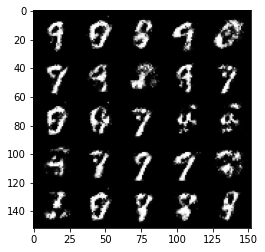

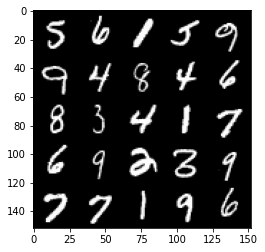

step 31000: Generator loss : 2.435085690498353, discriminator loss: 0.24456740832328797


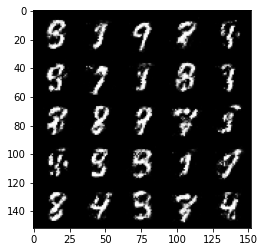

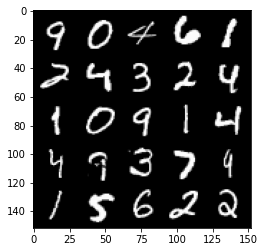

step 31500: Generator loss : 2.5461236171722392, discriminator loss: 0.2290256510972977


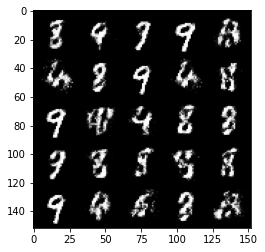

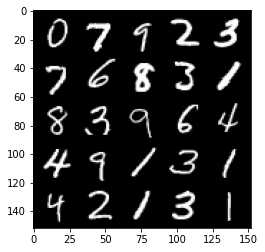

step 32000: Generator loss : 2.3883719019889837, discriminator loss: 0.2629991142153739


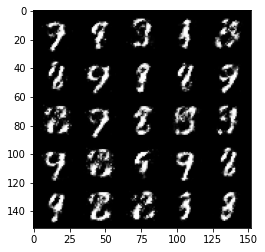

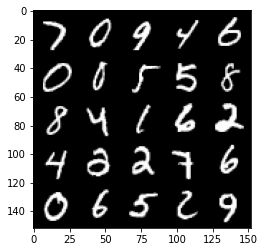

step 32500: Generator loss : 2.486560070991516, discriminator loss: 0.2534254273772236


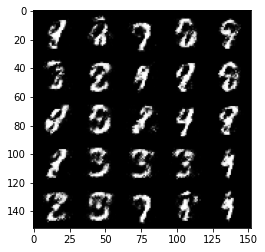

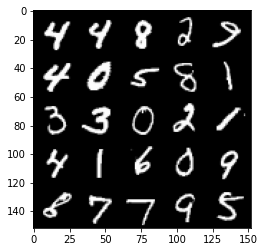

step 33000: Generator loss : 2.4263108601570145, discriminator loss: 0.2561742610931396


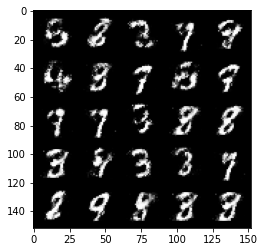

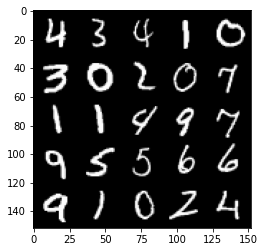

step 33500: Generator loss : 2.4117193522453313, discriminator loss: 0.24125309756398225


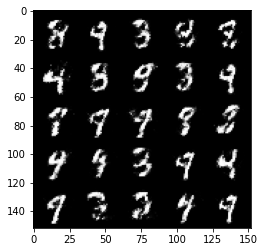

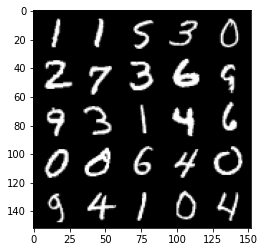

step 34000: Generator loss : 2.428481521129608, discriminator loss: 0.2572407566308977


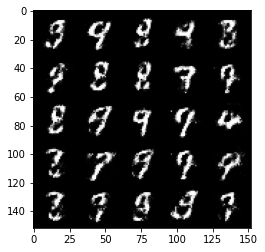

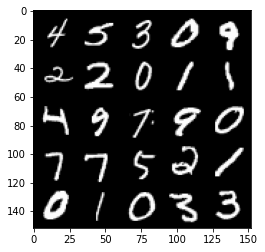

step 34500: Generator loss : 2.3437042081356045, discriminator loss: 0.25772164234519


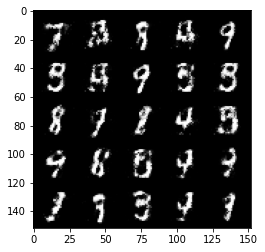

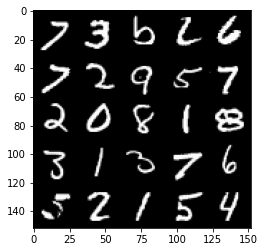

step 35000: Generator loss : 2.371185811996461, discriminator loss: 0.250175648123026


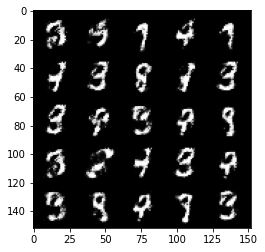

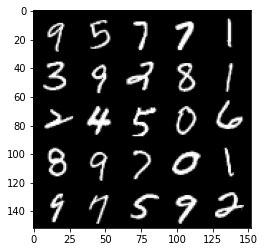

step 35500: Generator loss : 2.330272785663604, discriminator loss: 0.2606562457680701


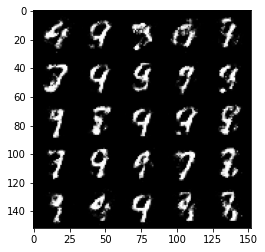

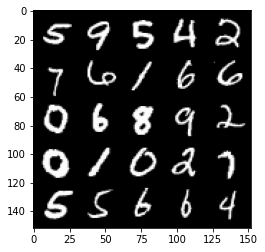

step 36000: Generator loss : 2.3333383924961075, discriminator loss: 0.27634522163867953


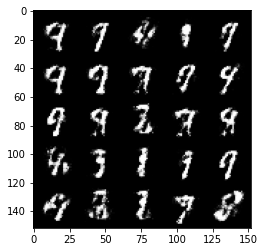

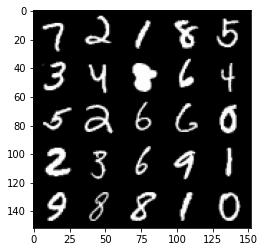

step 36500: Generator loss : 2.342045005559924, discriminator loss: 0.26030867609381686


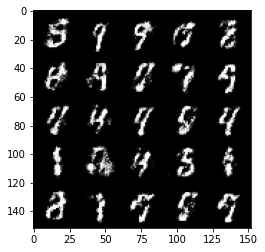

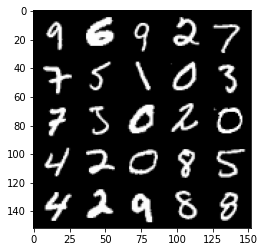

step 37000: Generator loss : 2.37905853843689, discriminator loss: 0.2551222735345362


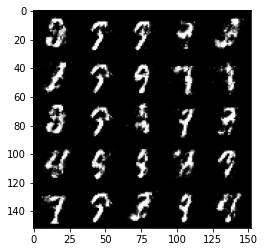

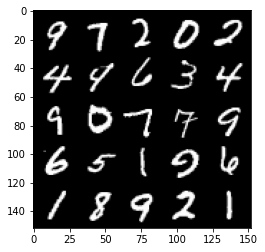

step 37500: Generator loss : 2.2896273453235647, discriminator loss: 0.2707821790277955


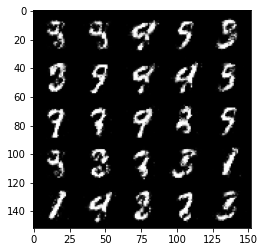

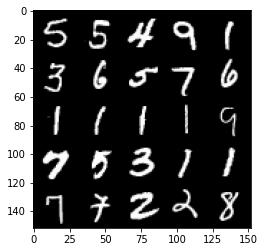

step 38000: Generator loss : 2.2786774013042463, discriminator loss: 0.2729066285192966


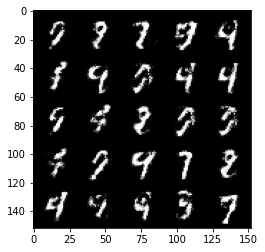

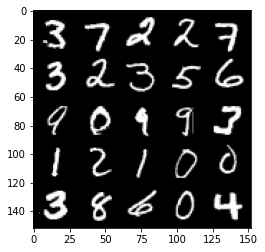

step 38500: Generator loss : 2.228895458459854, discriminator loss: 0.2798663773238661


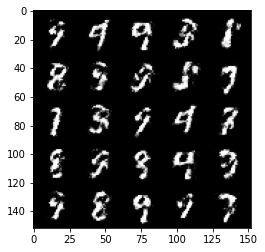

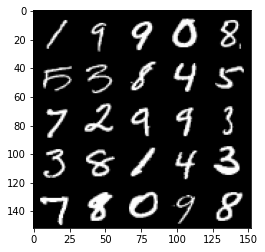

step 39000: Generator loss : 2.2950577180385605, discriminator loss: 0.2729688916206359


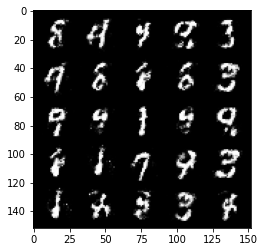

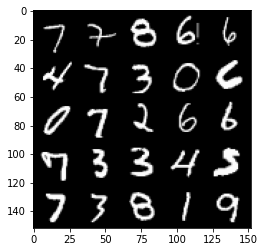

step 39500: Generator loss : 2.159536159753802, discriminator loss: 0.28591289111971835


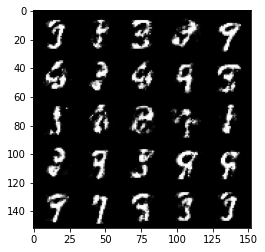

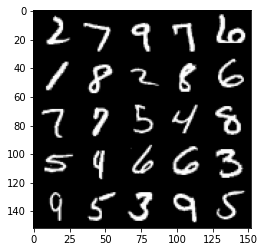

step 40000: Generator loss : 2.175792146921158, discriminator loss: 0.288263889223337


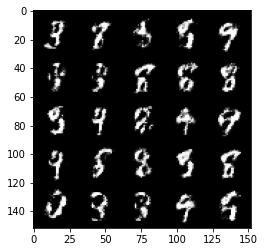

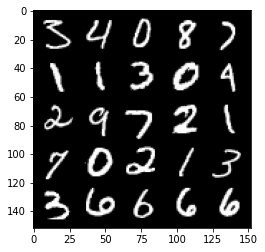

step 40500: Generator loss : 2.18872580432892, discriminator loss: 0.2879780028164388


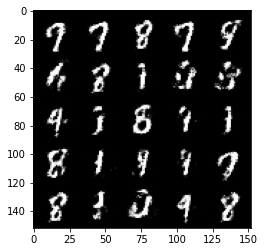

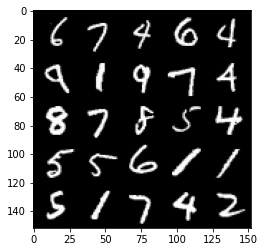

step 41000: Generator loss : 2.151910955190658, discriminator loss: 0.29058076223731005


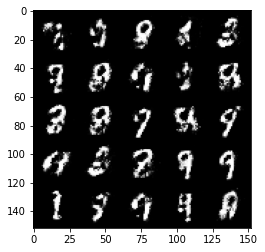

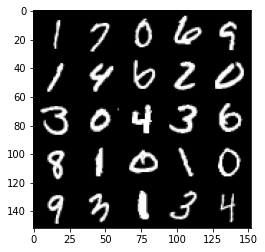

step 41500: Generator loss : 2.076298601865768, discriminator loss: 0.3089013335406778


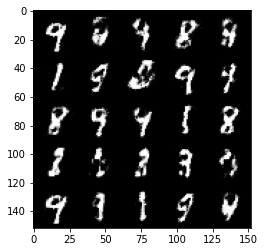

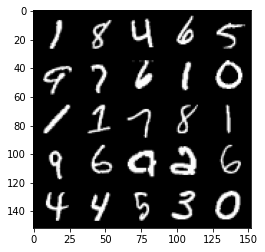

step 42000: Generator loss : 1.9803321478366847, discriminator loss: 0.3155335855782028


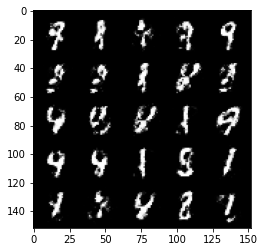

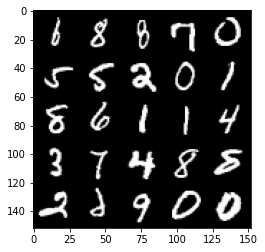

step 42500: Generator loss : 2.02245059871674, discriminator loss: 0.31145019665360446


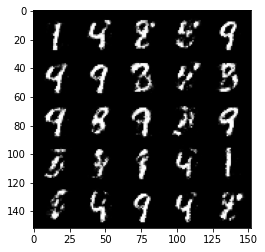

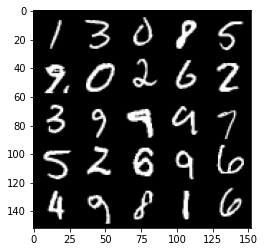

step 43000: Generator loss : 2.1103838775157935, discriminator loss: 0.2943595259487627


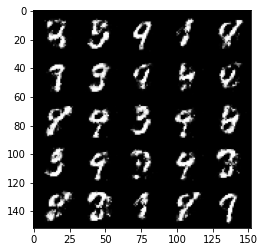

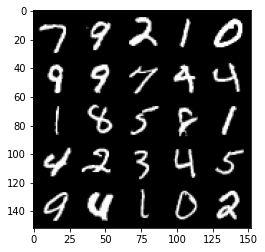

step 43500: Generator loss : 2.0955392138957976, discriminator loss: 0.3035331106483937


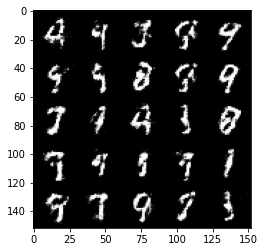

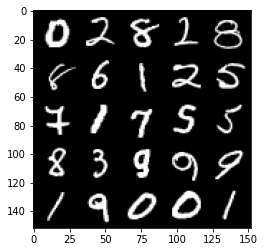

step 44000: Generator loss : 2.1079576108455647, discriminator loss: 0.3059583611190318


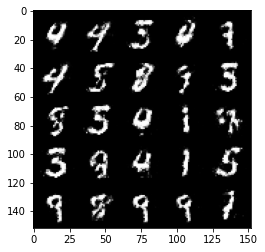

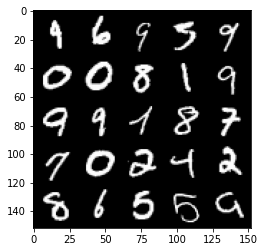

step 44500: Generator loss : 1.9432612359523767, discriminator loss: 0.3406813985705374


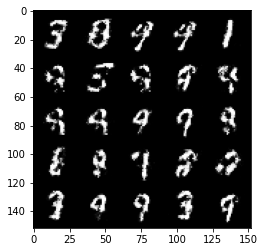

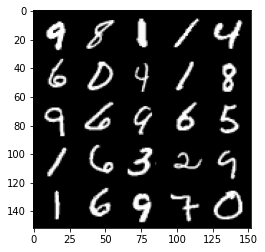

step 45000: Generator loss : 1.97301503944397, discriminator loss: 0.3158220157027243


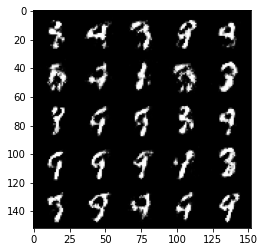

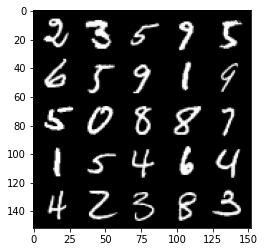

step 45500: Generator loss : 1.9931945672035216, discriminator loss: 0.33523877191543605


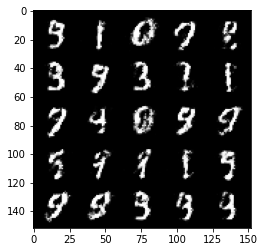

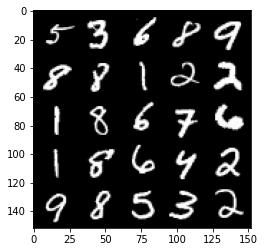

step 46000: Generator loss : 1.9263629386425025, discriminator loss: 0.3489677740931509


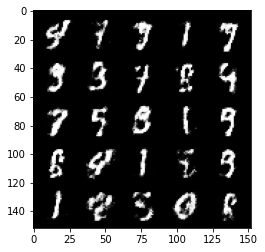

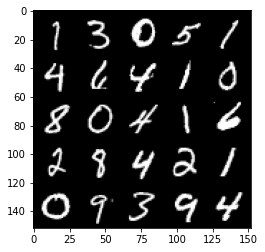

step 46500: Generator loss : 1.8224092345237726, discriminator loss: 0.3478108976483342


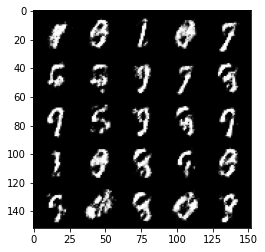

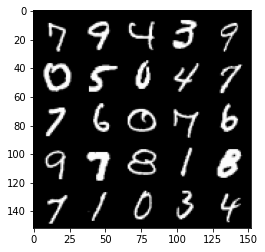

step 47000: Generator loss : 1.9124347629547143, discriminator loss: 0.3287475685477257


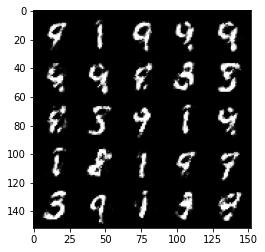

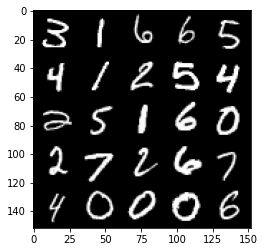

step 47500: Generator loss : 1.8802925546169287, discriminator loss: 0.3303340645432476


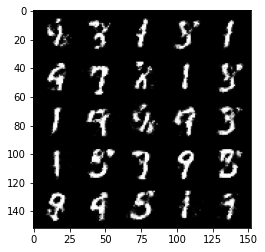

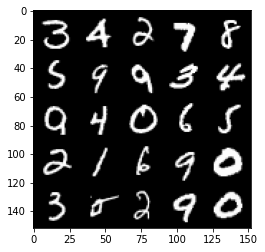

step 48000: Generator loss : 1.9497821459770204, discriminator loss: 0.316609186291695


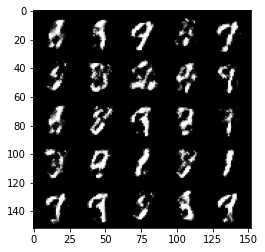

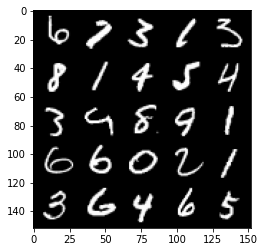

step 48500: Generator loss : 1.9241064374446877, discriminator loss: 0.3293712333738804


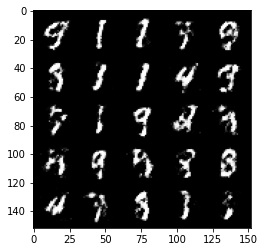

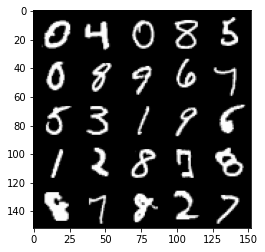

step 49000: Generator loss : 1.9559042804241162, discriminator loss: 0.31893388551473645


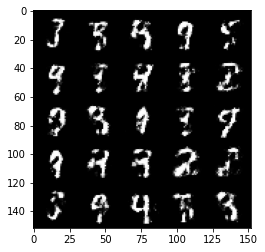

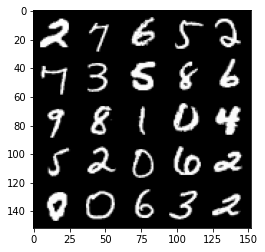

step 49500: Generator loss : 1.952746701240541, discriminator loss: 0.3194963006973262


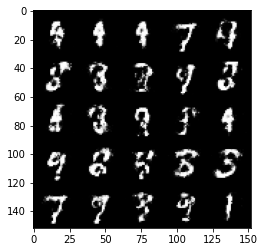

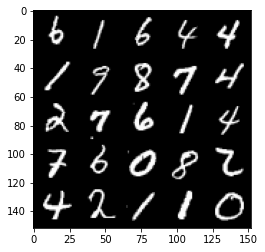

step 50000: Generator loss : 1.8584084720611582, discriminator loss: 0.3402843312621118


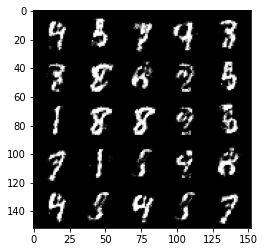

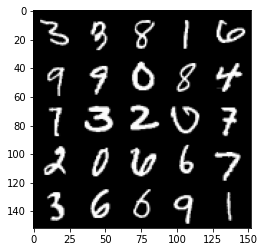

step 50500: Generator loss : 1.8656443541049959, discriminator loss: 0.3409004049003125


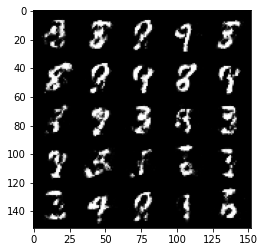

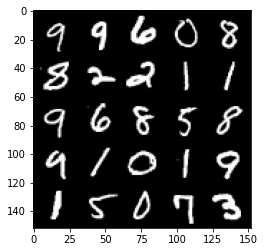

step 51000: Generator loss : 1.7862929172515885, discriminator loss: 0.3576730759739875


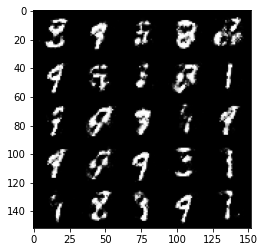

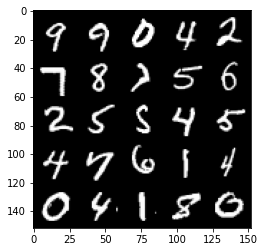

step 51500: Generator loss : 1.8346540493965142, discriminator loss: 0.34192421615123775


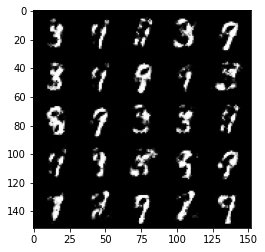

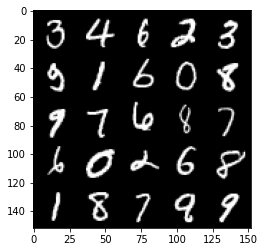

step 52000: Generator loss : 1.8267029297351853, discriminator loss: 0.35184897819161387


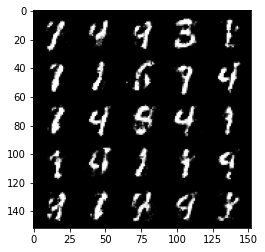

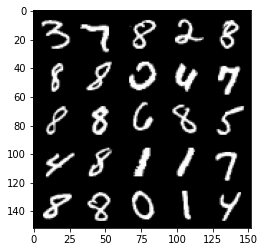

step 52500: Generator loss : 1.8365486788749679, discriminator loss: 0.35919576740264925


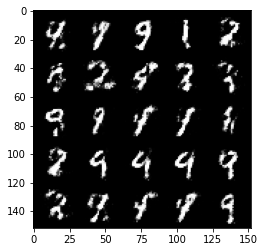

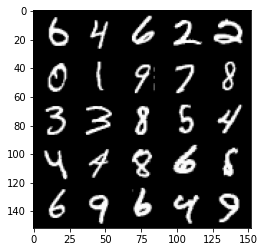

step 53000: Generator loss : 1.8447330584526052, discriminator loss: 0.34414060491323484


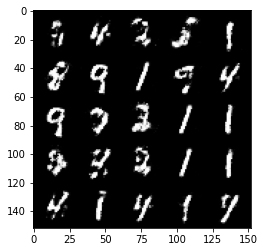

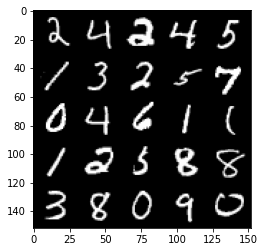

step 53500: Generator loss : 1.8001173567771909, discriminator loss: 0.3589280146360394


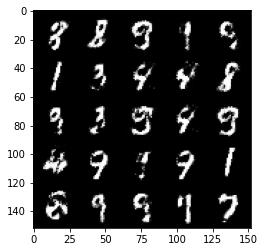

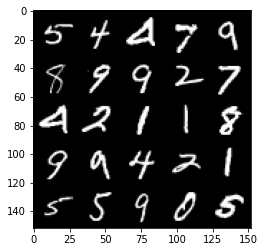

step 54000: Generator loss : 1.7278696336746215, discriminator loss: 0.37123016148805604


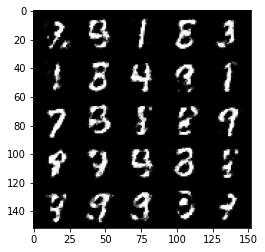

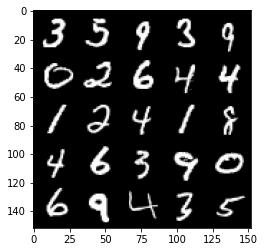

step 54500: Generator loss : 1.7314077558517444, discriminator loss: 0.37048706716299024


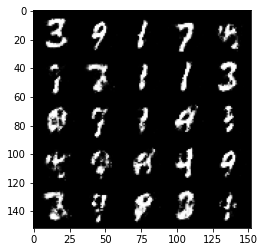

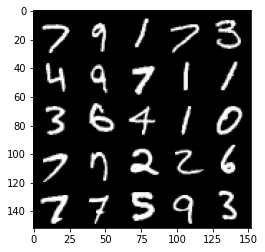

step 55000: Generator loss : 1.7670093593597418, discriminator loss: 0.35794151782989514


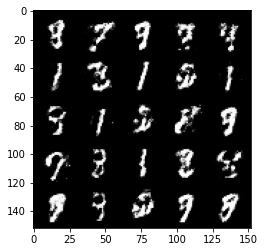

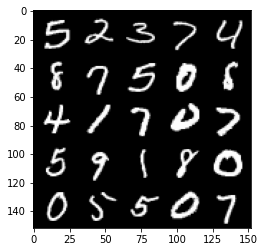

step 55500: Generator loss : 1.667344629764558, discriminator loss: 0.3845453113913538


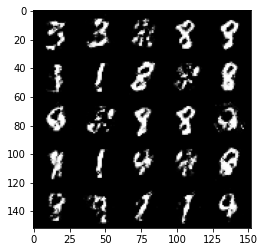

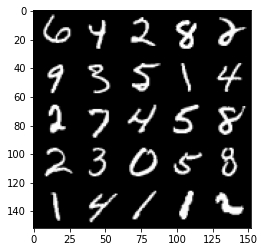

step 56000: Generator loss : 1.7298596804142004, discriminator loss: 0.36419359761476483


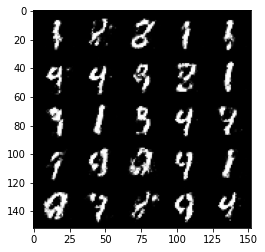

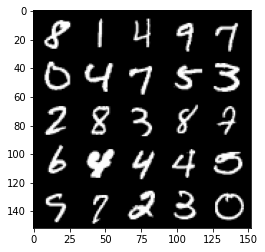

step 56500: Generator loss : 1.627369912862778, discriminator loss: 0.40290492594242105


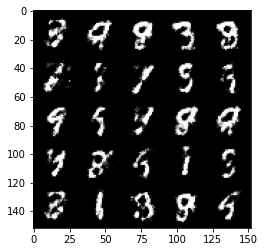

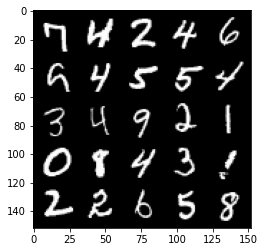

step 57000: Generator loss : 1.631521426916123, discriminator loss: 0.3928478213548664


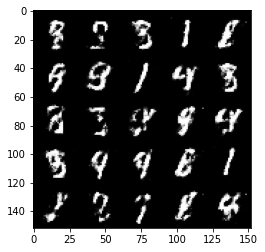

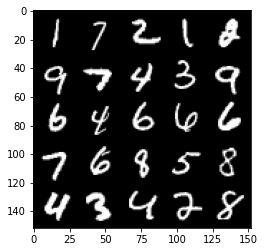

step 57500: Generator loss : 1.683828580856322, discriminator loss: 0.3829961447715758


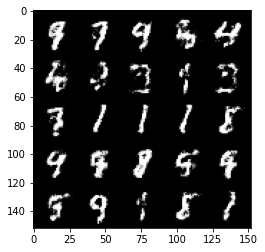

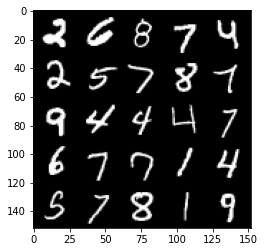

step 58000: Generator loss : 1.6432616279125214, discriminator loss: 0.3823773003220557


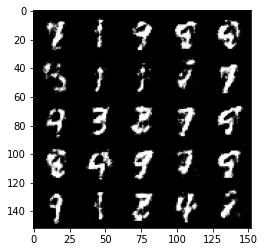

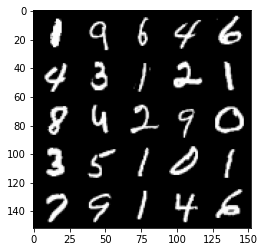

step 58500: Generator loss : 1.6774234166145312, discriminator loss: 0.38585122674703565


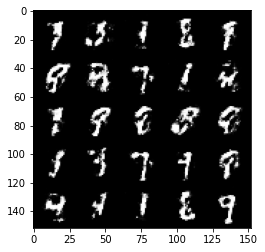

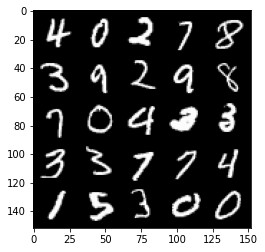

step 59000: Generator loss : 1.7389169909954085, discriminator loss: 0.3649773032665251


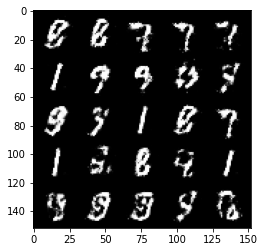

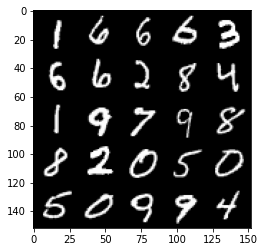

step 59500: Generator loss : 1.6808031702041613, discriminator loss: 0.38017767149209974


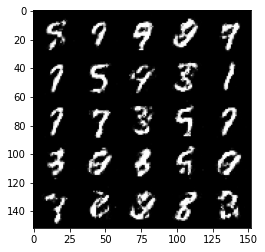

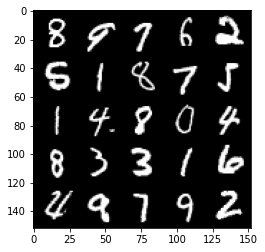

step 60000: Generator loss : 1.6819294519424448, discriminator loss: 0.3771486510634425


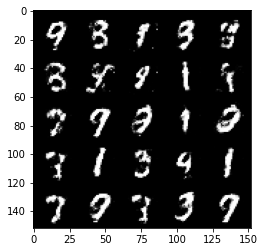

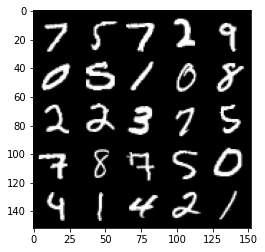

step 60500: Generator loss : 1.6389801368713381, discriminator loss: 0.39183448863029435


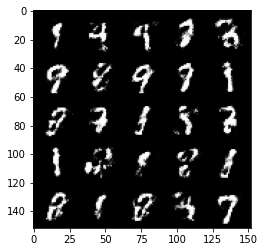

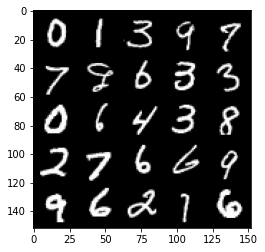

step 61000: Generator loss : 1.6462815368175507, discriminator loss: 0.3858864500522616


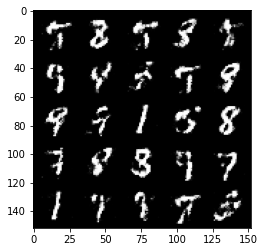

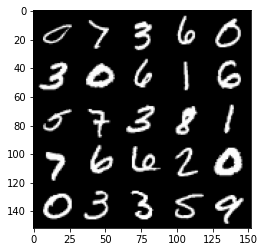

step 61500: Generator loss : 1.6725766870975487, discriminator loss: 0.3727754967808725


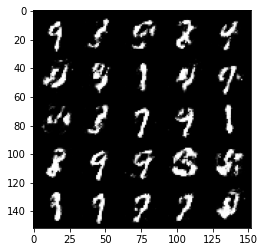

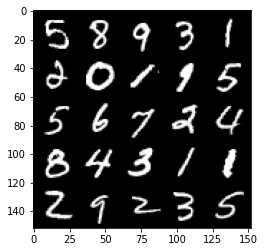

step 62000: Generator loss : 1.7288211007118222, discriminator loss: 0.36044096118211755


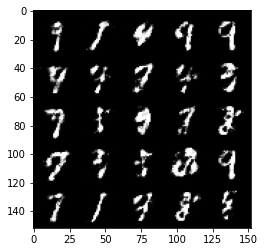

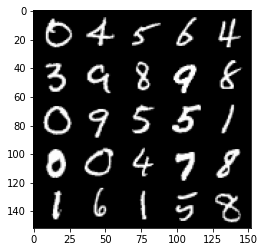

step 62500: Generator loss : 1.585583455324171, discriminator loss: 0.4071202185153961


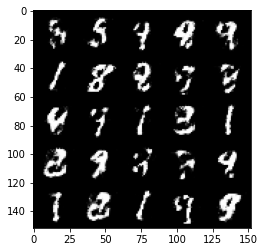

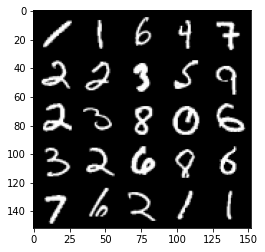

step 63000: Generator loss : 1.5221000945568082, discriminator loss: 0.4081545975208285


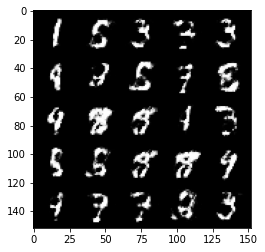

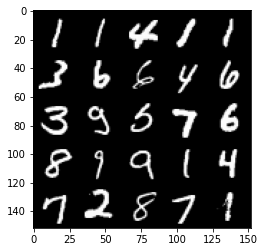

step 63500: Generator loss : 1.5676359729766838, discriminator loss: 0.39691122710704824


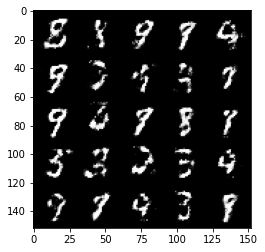

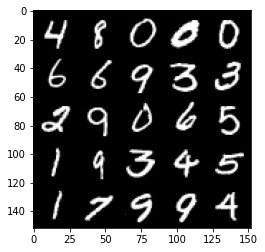

step 64000: Generator loss : 1.6378750023841842, discriminator loss: 0.3846998983025548


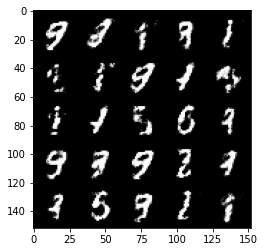

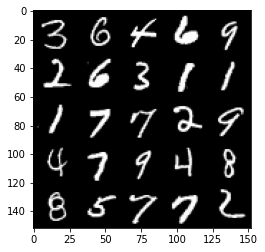

step 64500: Generator loss : 1.629794662237169, discriminator loss: 0.3974774242639537


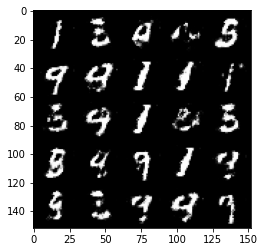

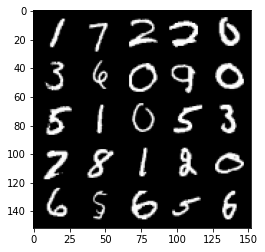

step 65000: Generator loss : 1.5727972462177282, discriminator loss: 0.3927552224993707


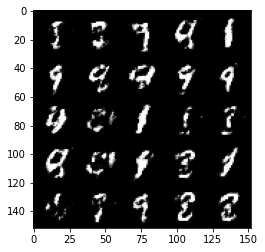

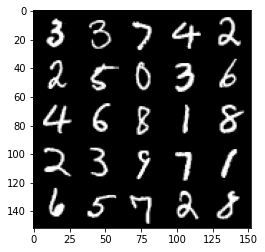

step 65500: Generator loss : 1.505193254709246, discriminator loss: 0.4333841452598567


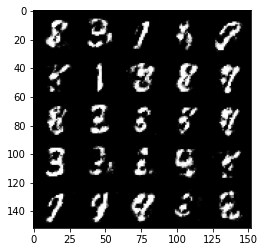

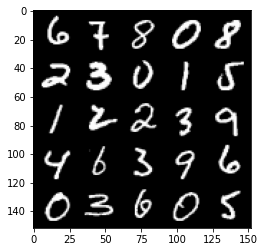

step 66000: Generator loss : 1.5814843683242796, discriminator loss: 0.4118503205776215


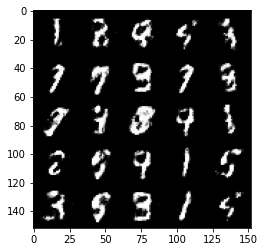

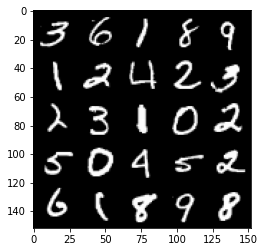

step 66500: Generator loss : 1.444411425352096, discriminator loss: 0.46376986396312747


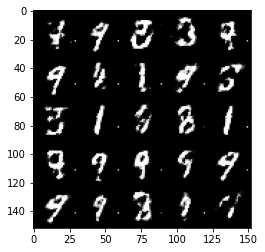

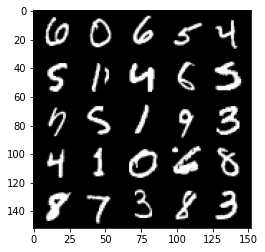

step 67000: Generator loss : 1.6042691507339477, discriminator loss: 0.39158358508348434


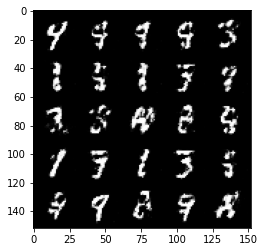

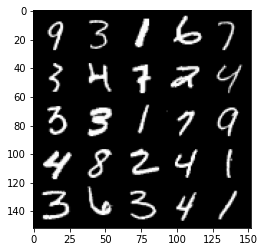

step 67500: Generator loss : 1.5450556936264037, discriminator loss: 0.43099269181489974


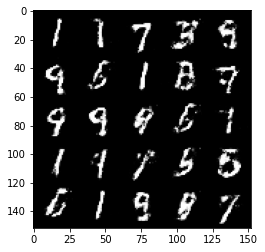

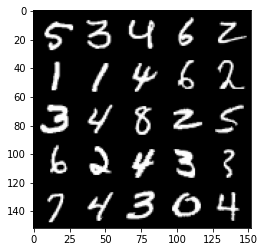

step 68000: Generator loss : 1.5035285460948946, discriminator loss: 0.42699453651905045


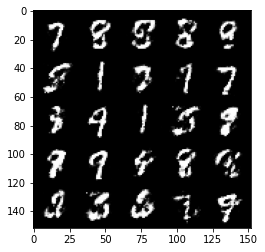

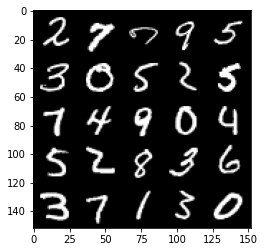

step 68500: Generator loss : 1.6252410008907308, discriminator loss: 0.37914346158504497


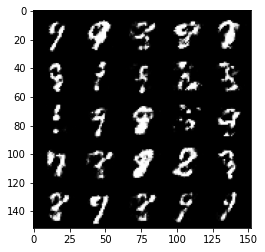

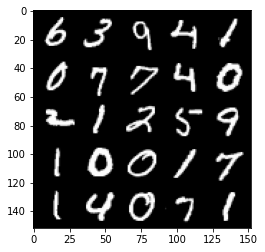

step 69000: Generator loss : 1.4828728835582723, discriminator loss: 0.4502881246805187


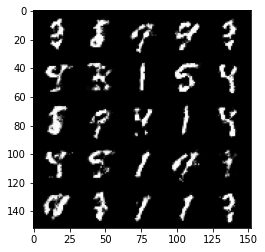

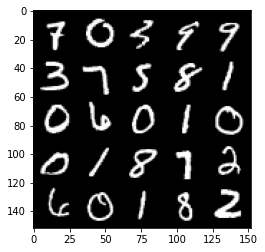

step 69500: Generator loss : 1.5429728882312783, discriminator loss: 0.39642470949888187


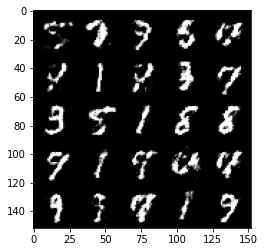

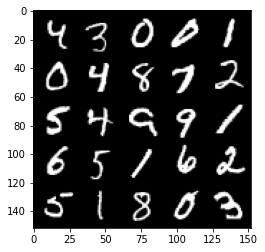

step 70000: Generator loss : 1.4890540490150441, discriminator loss: 0.4149925484061243


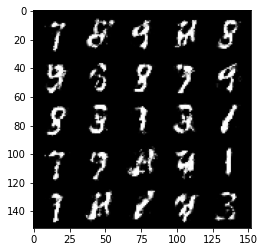

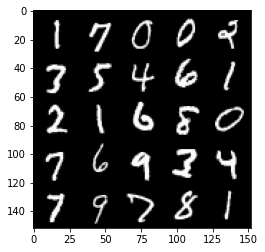

step 70500: Generator loss : 1.5124083936214443, discriminator loss: 0.4087583063840866


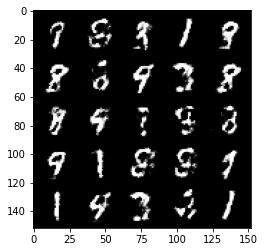

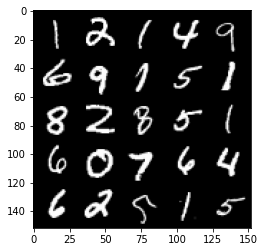

step 71000: Generator loss : 1.5465911118984204, discriminator loss: 0.41054207915067714


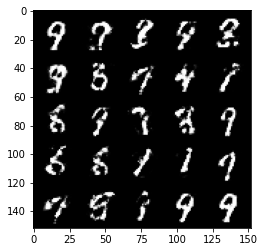

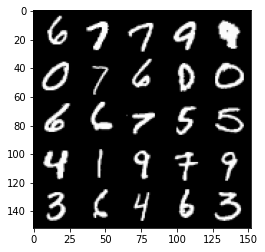

step 71500: Generator loss : 1.5002393693923943, discriminator loss: 0.42233809071779255


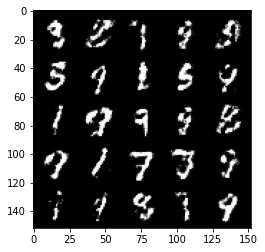

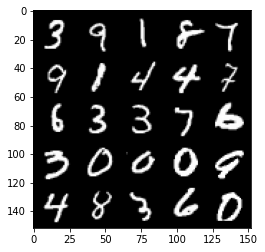

step 72000: Generator loss : 1.535997119426725, discriminator loss: 0.40445185291767116


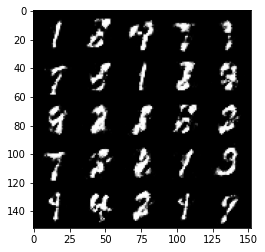

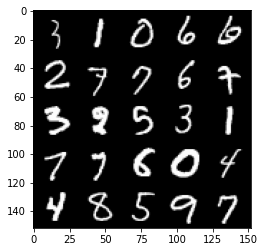

step 72500: Generator loss : 1.5233096129894235, discriminator loss: 0.40662139219045684


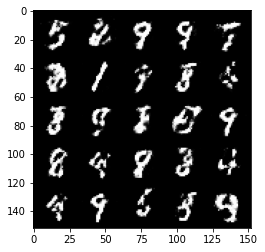

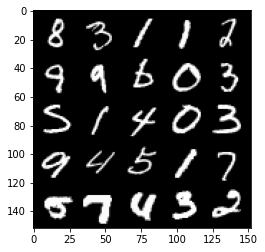

step 73000: Generator loss : 1.4992500736713417, discriminator loss: 0.4349270323514936


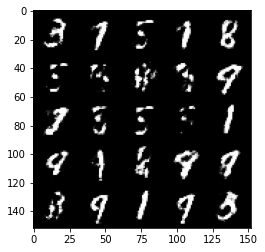

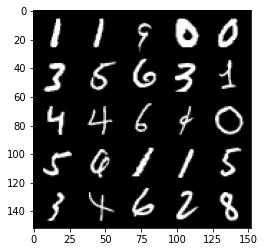

step 73500: Generator loss : 1.5069339215755464, discriminator loss: 0.412806886911392


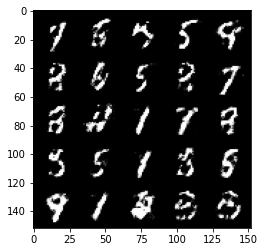

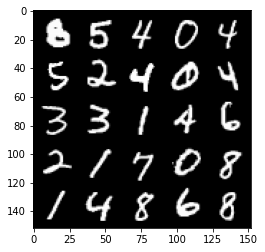

step 74000: Generator loss : 1.5007749576568605, discriminator loss: 0.4280317025780677


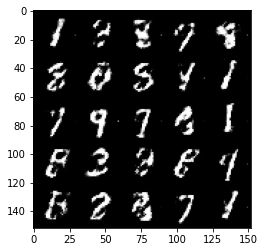

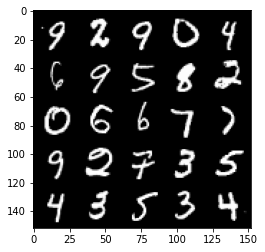

step 74500: Generator loss : 1.5086018795967109, discriminator loss: 0.4076606494188311


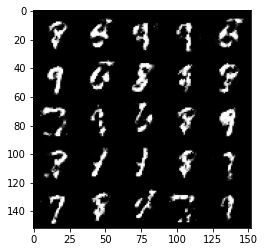

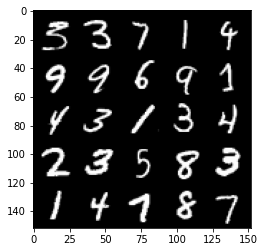

step 75000: Generator loss : 1.5042642135620128, discriminator loss: 0.4080068529248239


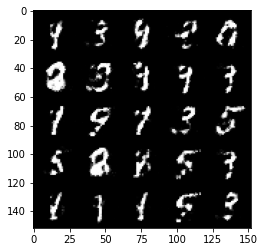

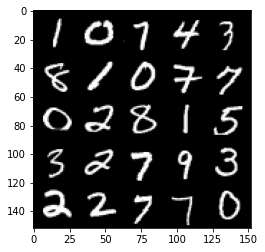

step 75500: Generator loss : 1.4950430297851545, discriminator loss: 0.4347155157923703


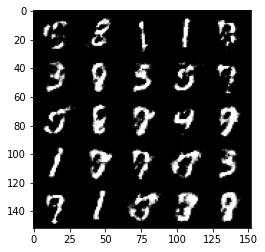

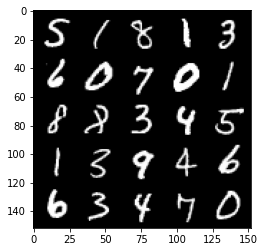

step 76000: Generator loss : 1.377101855754852, discriminator loss: 0.4649110496044166


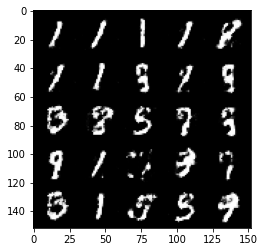

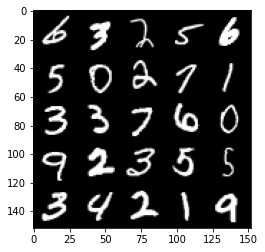

step 76500: Generator loss : 1.4149270033836356, discriminator loss: 0.4453400897979733


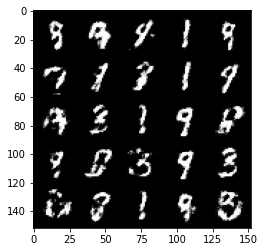

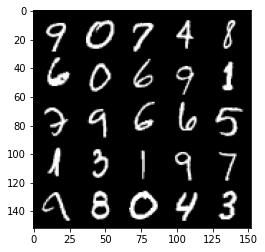

step 77000: Generator loss : 1.4551897914409655, discriminator loss: 0.42321727484464644


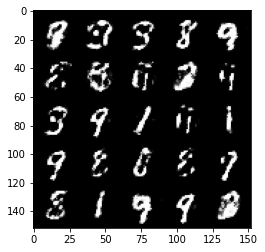

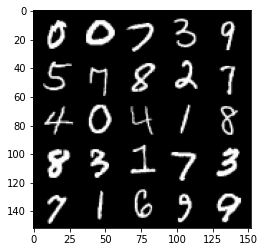

step 77500: Generator loss : 1.3967257950305938, discriminator loss: 0.4506820384860037


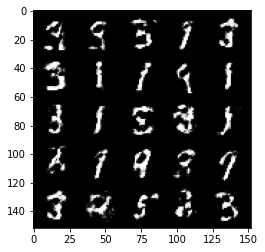

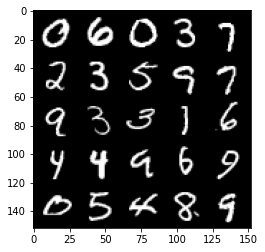

step 78000: Generator loss : 1.374024767875671, discriminator loss: 0.4441422304511071


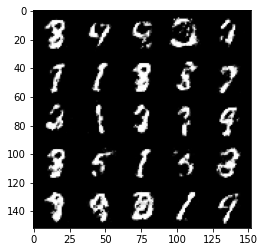

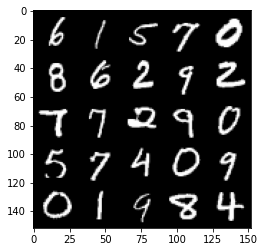

step 78500: Generator loss : 1.3528812694549566, discriminator loss: 0.4676912991404539


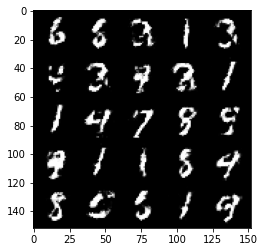

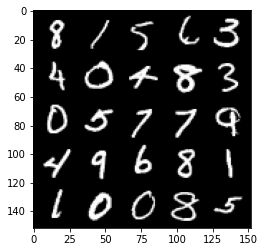

step 79000: Generator loss : 1.3490757679939263, discriminator loss: 0.44973286885023056


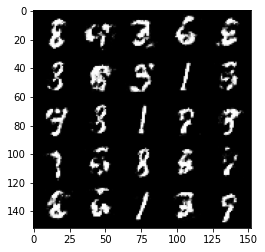

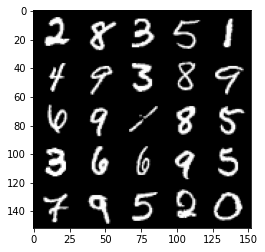

step 79500: Generator loss : 1.358500081777573, discriminator loss: 0.4597982831001283


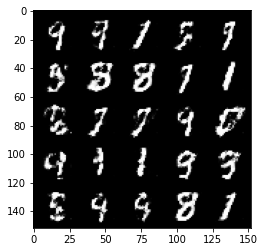

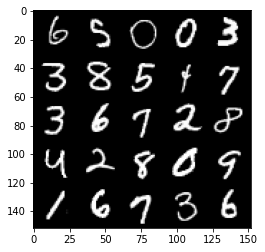

step 80000: Generator loss : 1.40480027627945, discriminator loss: 0.44245555484294863


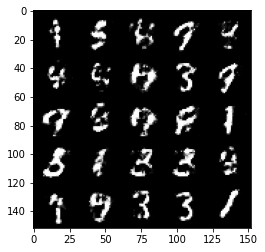

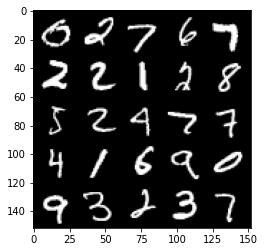

step 80500: Generator loss : 1.430894058704377, discriminator loss: 0.43477030813694023


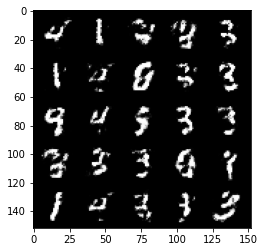

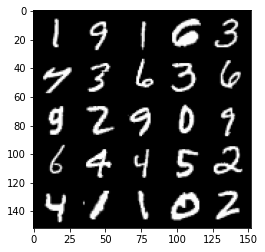

step 81000: Generator loss : 1.4362321953773487, discriminator loss: 0.4222263038754464


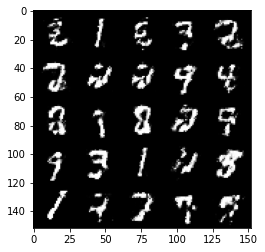

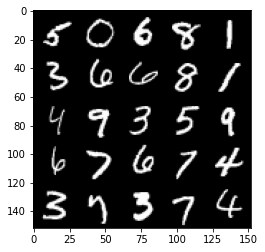

step 81500: Generator loss : 1.4289475517272952, discriminator loss: 0.42213642984628663


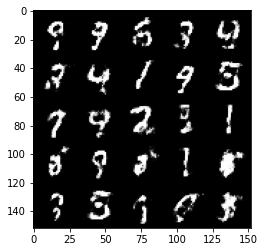

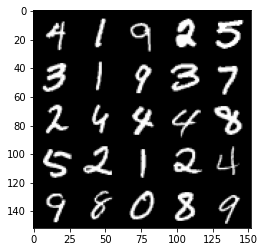

step 82000: Generator loss : 1.4384744846820847, discriminator loss: 0.4269381700754165


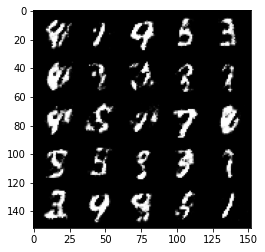

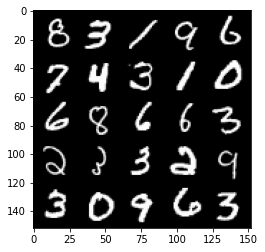

step 82500: Generator loss : 1.3613040783405292, discriminator loss: 0.45050111502408935


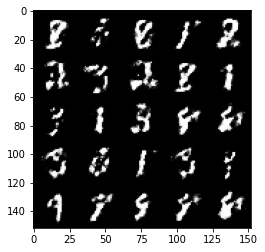

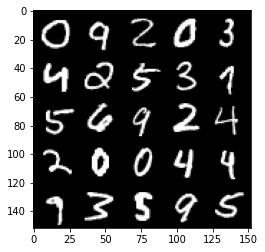

step 83000: Generator loss : 1.460885879039763, discriminator loss: 0.41958203536272065


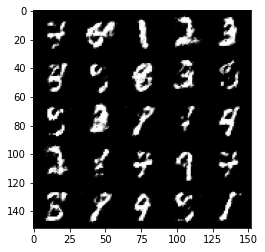

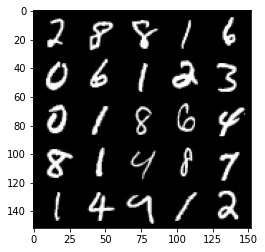

step 83500: Generator loss : 1.37464362168312, discriminator loss: 0.4424392752647405


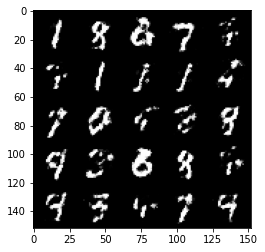

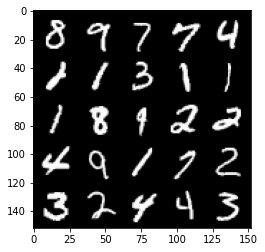

step 84000: Generator loss : 1.371290886640547, discriminator loss: 0.44605760776996634


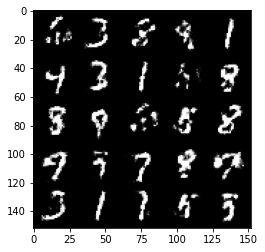

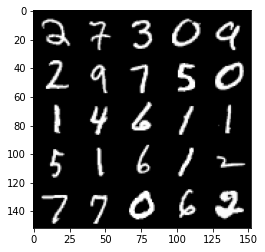

step 84500: Generator loss : 1.3291438517570489, discriminator loss: 0.46466513991355896


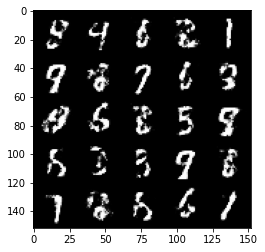

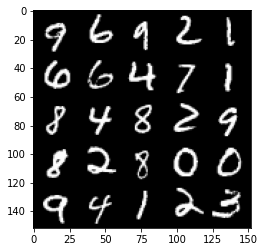

step 85000: Generator loss : 1.3769459593296052, discriminator loss: 0.44793912255764


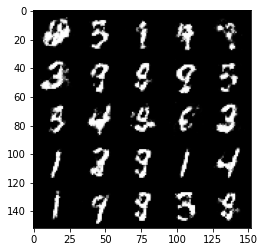

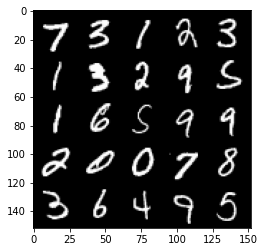

step 85500: Generator loss : 1.3927065443992614, discriminator loss: 0.4446109836101529


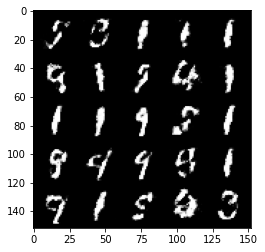

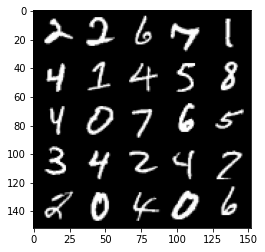

step 86000: Generator loss : 1.3929640622138992, discriminator loss: 0.45589976173639296


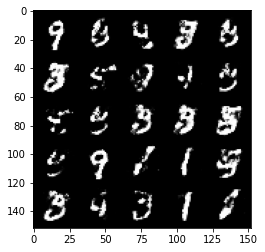

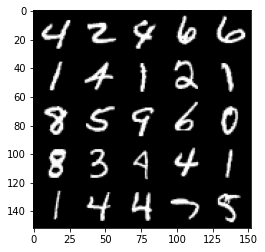

step 86500: Generator loss : 1.2628573355674755, discriminator loss: 0.489024075388908


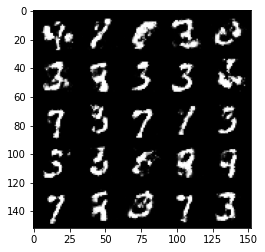

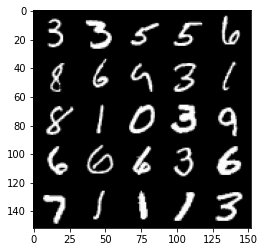

step 87000: Generator loss : 1.343289544582368, discriminator loss: 0.4515577350258827


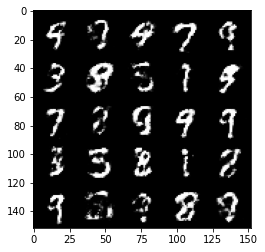

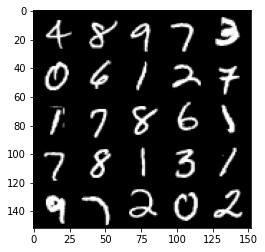

step 87500: Generator loss : 1.3155952897071836, discriminator loss: 0.46453448921442064


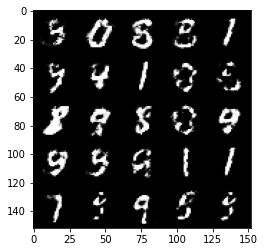

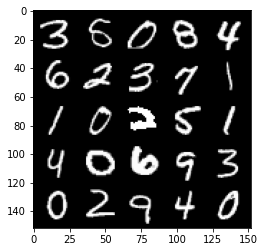

In [ ]:

for epoch in range(n_epochs):
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        disc_opt.zero_grad()
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        disc_loss.backward(retain_graph=True)
        disc_opt.step()

        if test_generator:
            old_generator_weight = gen.gen[0][0].weight.detach().clone()

        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward()
        gen_opt.step()

        # if test_generator:
        #     try:
        #         assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
        #         assert torch.any(gen.gen[0][0].weigth.detach().clone() != old_generator_weight)
        #     except:
        #         error = True
        #         print("Runtime tests have failed")

        mean_discriminator_loss += disc_loss.item() / display_step

        mean_generator_loss += gen_loss.item() / display_step

        if cur_step % display_step == 0 and cur_step > 0:
            print(f"step {cur_step}: Generator loss : {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1

In [ ]:

import matplotlib.pyplot as plt